In [1]:
import os
import gc
from tqdm import tqdm
import illustris_python as il
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.ndimage import gaussian_filter
# %matplotlib widget
basePath = "./sims.TNG/TNG50-1/output"

Snapshot_Init = 71
Snapshot_End = 99
Lbsg_Indcies_Array = np.array(
    [117251, 300903, 324123, 329508, 382215,
        400973, 419618, 457431, 460722, 490814]
)

h = 0.6774  # km/Mpc

m_dm = 4.5e-5  # E10M_Sum
m_dm_h = m_dm * h

Critial_Density = 1.27e-8  # E10M_Sum/kpc^3
Critial_Density_h = Critial_Density / h**2  # E10M_Sum/(kpc/h)^3


In [2]:
PartType4_Fields = ["Masses", "GFM_StellarFormationTime", "Coordinates"]
PartType0_Fields = ["Coordinates", "Masses", "NeutralHydrogenAbundance"]


In [3]:
Current_Snapshot = 99
Subhalo_Index = 329508
PartType4_Dict = il.snapshot.loadSubhalo(
    basePath, Current_Snapshot, Subhalo_Index, 4, PartType4_Fields)


In [5]:
old_indices=np.where(PartType4_Dict['GFM_StellarFormationTime']>0.3)[0]
new_indices=np.where(PartType4_Dict['GFM_StellarFormationTime']<0.3)[0]


In [5]:
hist, xedges, yedges = np.histogram2d(PartType4_Dict['Coordinates'][old_indices,1],
                                      PartType4_Dict['Coordinates'][old_indices,2],
                                      bins=(900, 900),
                                      range=[[19800, 20400],[21800, 22400]])



In [52]:
Current_Snapshot = 99
Subhalo_Index = 329508
PartType0_Dict = il.snapshot.loadSubhalo(
    basePath, Current_Snapshot, Subhalo_Index, 0, PartType0_Fields)


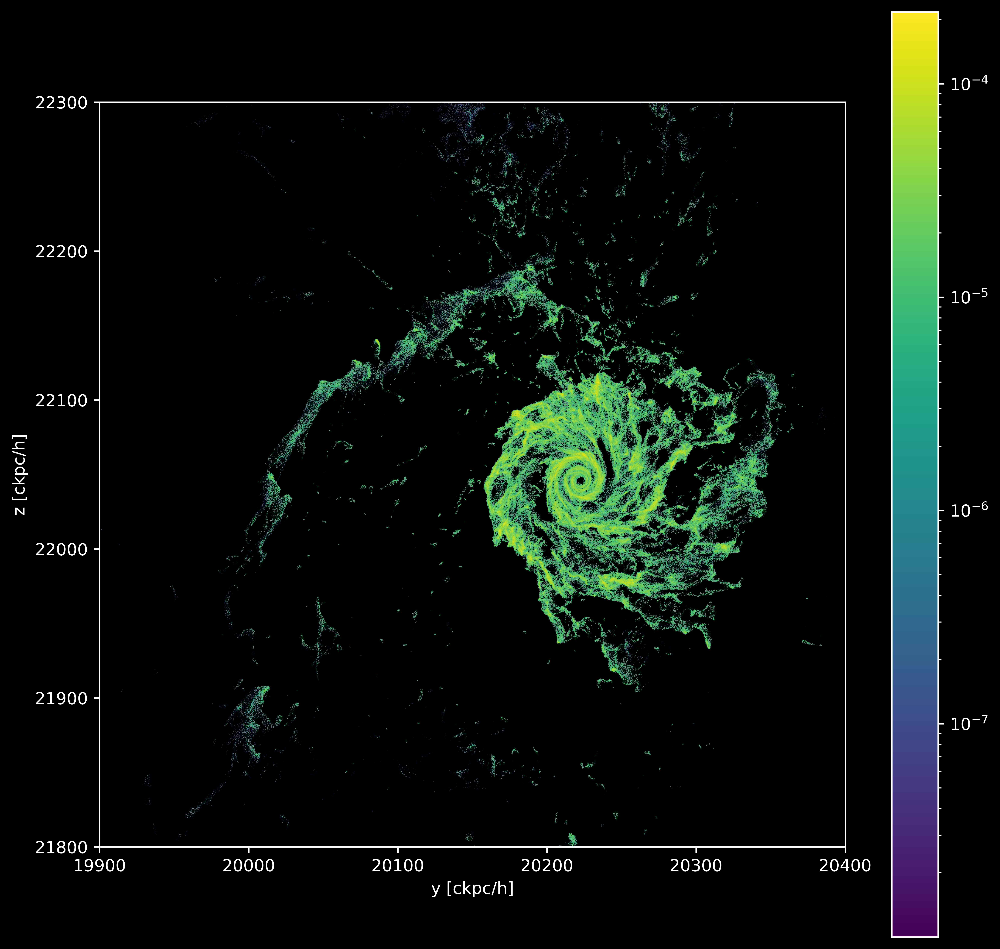

In [58]:
plt.figure(figsize=(10, 10), dpi=800)

plt.style.use("dark_background")

h, _, _, image = plt.hist2d(PartType0_Dict['Coordinates'][:,1],
                            PartType0_Dict['Coordinates'][:,2],
                            weights=PartType0_Dict['Masses']*PartType0_Dict['NeutralHydrogenAbundance'],
                            norm=mpl.colors.LogNorm(),
                            cmin=1e-8,
                            bins=(5000, 5000))
plt.ylim([21800, 22300])
plt.xlim([19900, 20400])
plt.xlabel('y [ckpc/h]')
plt.ylabel('z [ckpc/h]')
plt.colorbar(image)
plt.gca().set_aspect(1)
plt.show()


In [46]:
class Cell:
    def __init__(self):
        self.Coordinate = np.array([0.0, 0.0, 0.0])
        self.Mass = 0.0


class Cloud:
    def __init__(self, x_range, y_range):
        x_min, x_max = x_range
        y_min, y_max = y_range
        x_centers = np.arange(x_min + 0.0625, x_max, 0.125)
        y_centers = np.arange(y_min + 0.0625, y_max, 0.125)
        xx, yy = np.meshgrid(x_centers, y_centers)
        self.cells = [Cell() for _ in range(xx.size)]
        self.x_range = x_range
        self.y_range = y_range
        self.assign_coordinates(xx.flatten(), yy.flatten())

    def assign_coordinates(self, x_coords, y_coords):
        for i, cell in enumerate(self.cells):
            cell.Coordinate = np.array([0.0, y_coords[i], x_coords[i]])

    def assign_mass(self, coordinates: np.ndarray, masses: np.ndarray):
        x_min, x_max = self.x_range
        y_min, y_max = self.y_range
        x_bars = int((x_max - x_min) / 0.125)
        for i in range(coordinates.shape[0]):
            coord = coordinates[i]
            mass = masses[i]
            x_index = int((coord[1] - x_min) / 0.125)
            y_index = int((coord[2] - y_min) / 0.125)

            index = x_index * x_bars + y_index
            if (index>= len(self.cells)):continue
            if (index<0):continue
            self.cells[index].Mass += mass

    def visualize(self, savePath):
        plt.figure(figsize=(20, 20), dpi=300)
        plt.style.use("dark_background")
        x_range, y_range = self.x_range, self.y_range
        plt.hist2d([cell.Coordinate[1] for cell in self.cells], [cell.Coordinate[2] for cell in self.cells], norm=mpl.colors.LogNorm(),cmin=0.00005, bins=[int((y_range[1]-y_range[0])*2), int((x_range[1]-x_range[0])*2)], weights=[cell.Mass for cell in self.cells])
        plt.xlabel('y [ckpc/h]')
        plt.ylabel('z [ckpc/h]')
        plt.ylim(self.x_range[0],self.x_range[1])
        plt.xlim(self.y_range[0],self.y_range[1])
        plt.axes().get_xaxis().set_visible(False)
        plt.axes().get_yaxis().set_visible(False)
        plt.axis('equal')
        plt.savefig(savePath)
        plt.close('all')

    def reset(self):
        for cell in self.cells:
            cell.Coordinate = np.array([0.0, 0.0, 0.0])
            cell.Mass = 0.0


In [47]:
xmin=il.groupcat.loadSingle(basePath,99,-1,329508)['SubhaloPos'][1]-100
xmax=il.groupcat.loadSingle(basePath,99,-1,329508)['SubhaloPos'][1]+100

ymin=il.groupcat.loadSingle(basePath,99,-1,329508)['SubhaloPos'][2]-100
ymax=il.groupcat.loadSingle(basePath,99,-1,329508)['SubhaloPos'][2]+100


In [51]:
cloud=Cloud([int(xmin),int(xmax)],[int(ymin),int(ymax)])


In [53]:
cloud.assign_mass(PartType0_Dict['Coordinates'], PartType0_Dict['Masses'])


In [50]:

plt.figure(figsize=(20, 20), dpi=500)
plt.style.use("dark_background")
x_range, y_range = cloud.x_range, cloud.y_range
plt.hist2d([cell.Coordinate[2] for cell in cloud.cells], [cell.Coordinate[1] for cell in cloud.cells], norm=mpl.colors.LogNorm(), bins=[int((y_range[1]-y_range[0])*8), int((x_range[1]-x_range[0])*8)], weights=[cell.Mass for cell in cloud.cells],cmap='gray')
plt.xlabel('y [ckpc/h]')
plt.ylabel('z [ckpc/h]')
plt.xlim(cloud.x_range[0],cloud.x_range[1])
plt.ylim(cloud.y_range[0],cloud.y_range[1])
#plt.axes().get_xaxis().set_visible(False)
#plt.axes().get_yaxis().set_visible(False)
plt.axis('equal')
plt.show()


In [58]:
plt.figure(figsize=(20, 20), dpi=500)
plt.style.use("dark_background")
x_range, y_range = cloud.x_range, cloud.y_range
plt.hist2d([cell.Coordinate[2] for cell in cloud.cells], [cell.Coordinate[1] for cell in cloud.cells], norm=mpl.colors.LogNorm(), bins=[int((y_range[1]-y_range[0])*8), int((x_range[1]-x_range[0])*8)],cmin=1e-5, weights=[cell.Mass for cell in cloud.cells],cmap='gray')
plt.xlabel('y [ckpc/h]')
plt.ylabel('z [ckpc/h]')
plt.xlim(cloud.x_range[0],cloud.x_range[1])
plt.ylim(cloud.y_range[0],cloud.y_range[1])
#plt.axes().get_xaxis().set_visible(False)
#plt.axes().get_yaxis().set_visible(False)
plt.axis('equal')
plt.show()
